In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=0.1 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 1.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 35570 
    Total predicted counts          : 35759.28
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 30.5 s, sys: 161 ms, total: 30.6 s
Wall time: 30.6 s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 36169 
    Total predicted counts          : 35806.08
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 35665 
    Total predicted counts          : 35869.68
    Total off counts                : 101992.00

    Total background counts         : 2

SpectrumDatasetOnOff

    Name                            : obs_30 

    Total counts                    : 36175 
    Total predicted counts          : 35714.88
    Total off counts                : 101218.00

    Total background counts         : 20243.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_31 

    Total counts                    : 35557 
    Total predicted counts          : 35669.08
    Total off counts                : 100989.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_62 

    Total counts                    : 35846 
    Total predicted counts          : 35774.88
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_63 

    Total counts                    : 35699 
    Total predicted counts          : 35754.48
    Total off counts                : 101416.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_97 

    Total counts                    : 35800 
    Total predicted counts          : 35756.28
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_98 

    Total counts                    : 35612 
    Total predicted counts          : 35742.28
    Total off counts                : 101355.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_133 

    Total counts                    : 35588 
    Total predicted counts          : 35779.88
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_134 

    Total counts                    : 35950 
    Total predicted counts          : 35784.08
    Total off counts                : 101564.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_169 

    Total counts                    : 35680 
    Total predicted counts          : 35737.88
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_170 

    Total counts                    : 35745 
    Total predicted counts          : 35846.88
    Total off counts                : 101878.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_204 

    Total counts                    : 36055 
    Total predicted counts          : 35830.28
    Total off counts                : 101795.00

    Total background counts         : 20359.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_205 

    Total counts                    : 35727 
    Total predicted counts          : 35907.08
    Total off counts                : 102179.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_240 

    Total counts                    : 35736 
    Total predicted counts          : 35820.48
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_241 

    Total counts                    : 35689 
    Total predicted counts          : 35778.88
    Total off counts                : 101538.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_275 

    Total counts                    : 35541 
    Total predicted counts          : 35855.08
    Total off counts                : 101919.00

    Total background counts         : 20383.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_276 

    Total counts                    : 36048 
    Total predicted counts          : 35768.08
    Total off counts                : 101484.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_311 

    Total counts                    : 35520 
    Total predicted counts          : 35792.28
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_312 

    Total counts                    : 35677 
    Total predicted counts          : 35758.48
    Total off counts                : 101436.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_346 

    Total counts                    : 35891 
    Total predicted counts          : 35769.68
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_347 

    Total counts                    : 35899 
    Total predicted counts          : 35847.68
    Total off counts                : 101882.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_381 

    Total counts                    : 35940 
    Total predicted counts          : 35727.48
    Total off counts                : 101281.00

    Total background counts         : 20256.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_382 

    Total counts                    : 35686 
    Total predicted counts          : 35790.28
    Total off counts                : 101595.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_417 

    Total counts                    : 35778 
    Total predicted counts          : 35814.88
    Total off counts                : 101718.00

    Total background counts         : 20343.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_418 

    Total counts                    : 35837 
    Total predicted counts          : 35777.28
    Total off counts                : 101530.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_453 

    Total counts                    : 35964 
    Total predicted counts          : 35850.08
    Total off counts                : 101894.00

    Total background counts         : 20378.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_454 

    Total counts                    : 36140 
    Total predicted counts          : 35733.28
    Total off counts                : 101310.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_489 

    Total counts                    : 35942 
    Total predicted counts          : 35820.48
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_490 

    Total counts                    : 35627 
    Total predicted counts          : 35773.08
    Total off counts                : 101509.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_525 

    Total counts                    : 35951 
    Total predicted counts          : 35722.68
    Total off counts                : 101257.00

    Total background counts         : 20251.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_526 

    Total counts                    : 35473 
    Total predicted counts          : 35734.08
    Total off counts                : 101314.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_560 

    Total counts                    : 35905 
    Total predicted counts          : 35769.08
    Total off counts                : 101489.00

    Total background counts         : 20297.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_561 

    Total counts                    : 35847 
    Total predicted counts          : 35758.48
    Total off counts                : 101436.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_595 

    Total counts                    : 35665 
    Total predicted counts          : 35812.28
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_596 

    Total counts                    : 35604 
    Total predicted counts          : 35695.08
    Total off counts                : 101119.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_630 

    Total counts                    : 35672 
    Total predicted counts          : 35803.28
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_631 

    Total counts                    : 35546 
    Total predicted counts          : 35862.88
    Total off counts                : 101958.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_665 

    Total counts                    : 35386 
    Total predicted counts          : 35789.28
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_666 

    Total counts                    : 35654 
    Total predicted counts          : 35772.68
    Total off counts                : 101507.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_701 

    Total counts                    : 35482 
    Total predicted counts          : 35874.28
    Total off counts                : 102015.00

    Total background counts         : 20403.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_702 

    Total counts                    : 35473 
    Total predicted counts          : 35828.48
    Total off counts                : 101786.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_735 

    Total counts                    : 35978 
    Total predicted counts          : 35787.88
    Total off counts                : 101583.00

    Total background counts         : 20316.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_736 

    Total counts                    : 35922 
    Total predicted counts          : 35846.68
    Total off counts                : 101877.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_769 

    Total counts                    : 35929 
    Total predicted counts          : 35747.28
    Total off counts                : 101380.00

    Total background counts         : 20276.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_770 

    Total counts                    : 36011 
    Total predicted counts          : 35704.68
    Total off counts                : 101167.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_803 

    Total counts                    : 35881 
    Total predicted counts          : 35720.88
    Total off counts                : 101248.00

    Total background counts         : 20249.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_804 

    Total counts                    : 35620 
    Total predicted counts          : 35860.28
    Total off counts                : 101945.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_839 

    Total counts                    : 35681 
    Total predicted counts          : 35803.08
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_840 

    Total counts                    : 35896 
    Total predicted counts          : 35829.28
    Total off counts                : 101790.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_875 

    Total counts                    : 36035 
    Total predicted counts          : 35682.88
    Total off counts                : 101058.00

    Total background counts         : 20211.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_876 

    Total counts                    : 35590 
    Total predicted counts          : 35797.68
    Total off counts                : 101632.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_911 

    Total counts                    : 35838 
    Total predicted counts          : 35808.28
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_912 

    Total counts                    : 36004 
    Total predicted counts          : 35786.68
    Total off counts                : 101577.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_946 

    Total counts                    : 35994 
    Total predicted counts          : 35889.08
    Total off counts                : 102089.00

    Total background counts         : 20417.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_947 

    Total counts                    : 35823 
    Total predicted counts          : 35698.88
    Total off counts                : 101138.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_982 

    Total counts                    : 35641 
    Total predicted counts          : 35767.28
    Total off counts                : 101480.00

    Total background counts         : 20296.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_983 

    Total counts                    : 35705 
    Total predicted counts          : 35900.08
    Total off counts                : 102144.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_1018 

    Total counts                    : 35515 
    Total predicted counts          : 35684.88
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1019 

    Total counts                    : 35891 
    Total predicted counts          : 35699.28
    Total off counts                : 101140.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1054 

    Total counts                    : 36293 
    Total predicted counts          : 35678.28
    Total off counts                : 101035.00

    Total background counts         : 20207.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1055 

    Total counts                    : 35654 
    Total predicted counts          : 35752.28
    Total off counts                : 101405.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1091 

    Total counts                    : 35871 
    Total predicted counts          : 35789.08
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1092 

    Total counts                    : 35537 
    Total predicted counts          : 35855.68
    Total off counts                : 101922.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1127 

    Total counts                    : 35723 
    Total predicted counts          : 35745.28
    Total off counts                : 101370.00

    Total background counts         : 20274.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1128 

    Total counts                    : 35954 
    Total predicted counts          : 35737.48
    Total off counts                : 101331.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1162 

    Total counts                    : 35986 
    Total predicted counts          : 35784.28
    Total off counts                : 101565.00

    Total background counts         : 20313.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1163 

    Total counts                    : 35768 
    Total predicted counts          : 35802.48
    Total off counts                : 101656.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1197 

    Total counts                    : 36003 
    Total predicted counts          : 35885.08
    Total off counts                : 102069.00

    Total background counts         : 20413.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1198 

    Total counts                    : 35671 
    Total predicted counts          : 35823.08
    Total off counts                : 101759.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1230 

    Total counts                    : 36052 
    Total predicted counts          : 35782.08
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1231 

    Total counts                    : 35988 
    Total predicted counts          : 35822.88
    Total off counts                : 101758.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1266 

    Total counts                    : 35687 
    Total predicted counts          : 35889.88
    Total off counts                : 102093.00

    Total background counts         : 20418.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1267 

    Total counts                    : 35992 
    Total predicted counts          : 35748.28
    Total off counts                : 101385.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1300 

    Total counts                    : 35753 
    Total predicted counts          : 35829.68
    Total off counts                : 101792.00

    Total background counts         : 20358.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1301 

    Total counts                    : 35881 
    Total predicted counts          : 35832.68
    Total off counts                : 101807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1336 

    Total counts                    : 35814 
    Total predicted counts          : 35769.68
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1337 

    Total counts                    : 35602 
    Total predicted counts          : 35690.28
    Total off counts                : 101095.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1371 

    Total counts                    : 35714 
    Total predicted counts          : 35686.28
    Total off counts                : 101075.00

    Total background counts         : 20215.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1372 

    Total counts                    : 35703 
    Total predicted counts          : 35873.08
    Total off counts                : 102009.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1405 

    Total counts                    : 35608 
    Total predicted counts          : 35886.28
    Total off counts                : 102075.00

    Total background counts         : 20415.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1406 

    Total counts                    : 35936 
    Total predicted counts          : 35763.48
    Total off counts                : 101461.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1440 

    Total counts                    : 35576 
    Total predicted counts          : 35835.88
    Total off counts                : 101823.00

    Total background counts         : 20364.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1441 

    Total counts                    : 35768 
    Total predicted counts          : 35737.68
    Total off counts                : 101332.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1476 

    Total counts                    : 35822 
    Total predicted counts          : 35851.28
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1477 

    Total counts                    : 35594 
    Total predicted counts          : 35697.68
    Total off counts                : 101132.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1512 

    Total counts                    : 35725 
    Total predicted counts          : 35697.08
    Total off counts                : 101129.00

    Total background counts         : 20225.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1513 

    Total counts                    : 35641 
    Total predicted counts          : 35842.48
    Total off counts                : 101856.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1549 

    Total counts                    : 35491 
    Total predicted counts          : 35739.08
    Total off counts                : 101339.00

    Total background counts         : 20267.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1550 

    Total counts                    : 35731 
    Total predicted counts          : 35735.88
    Total off counts                : 101323.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1585 

    Total counts                    : 35753 
    Total predicted counts          : 35824.88
    Total off counts                : 101768.00

    Total background counts         : 20353.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1586 

    Total counts                    : 35966 
    Total predicted counts          : 35805.28
    Total off counts                : 101670.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1622 

    Total counts                    : 35763 
    Total predicted counts          : 35733.68
    Total off counts                : 101312.00

    Total background counts         : 20262.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1623 

    Total counts                    : 36124 
    Total predicted counts          : 35696.88
    Total off counts                : 101128.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1658 

    Total counts                    : 36071 
    Total predicted counts          : 35721.68
    Total off counts                : 101252.00

    Total background counts         : 20250.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1659 

    Total counts                    : 35548 
    Total predicted counts          : 35791.88
    Total off counts                : 101603.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1694 

    Total counts                    : 36094 
    Total predicted counts          : 35866.48
    Total off counts                : 101976.00

    Total background counts         : 20395.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1695 

    Total counts                    : 35718 
    Total predicted counts          : 35677.08
    Total off counts                : 101029.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1729 

    Total counts                    : 35358 
    Total predicted counts          : 35738.28
    Total off counts                : 101335.00

    Total background counts         : 20267.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1730 

    Total counts                    : 35805 
    Total predicted counts          : 35756.48
    Total off counts                : 101426.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1765 

    Total counts                    : 35772 
    Total predicted counts          : 35794.68
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1766 

    Total counts                    : 36066 
    Total predicted counts          : 35793.28
    Total off counts                : 101610.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1801 

    Total counts                    : 35834 
    Total predicted counts          : 35806.08
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1802 

    Total counts                    : 35492 
    Total predicted counts          : 35821.68
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1837 

    Total counts                    : 35813 
    Total predicted counts          : 35784.08
    Total off counts                : 101564.00

    Total background counts         : 20312.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1838 

    Total counts                    : 35844 
    Total predicted counts          : 35780.08
    Total off counts                : 101544.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1874 

    Total counts                    : 35700 
    Total predicted counts          : 35758.88
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1875 

    Total counts                    : 35991 
    Total predicted counts          : 35759.68
    Total off counts                : 101442.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1910 

    Total counts                    : 35673 
    Total predicted counts          : 35840.28
    Total off counts                : 101845.00

    Total background counts         : 20369.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1911 

    Total counts                    : 36107 
    Total predicted counts          : 35852.48
    Total off counts                : 101906.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1945 

    Total counts                    : 35690 
    Total predicted counts          : 35757.08
    Total off counts                : 101429.00

    Total background counts         : 20285.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1946 

    Total counts                    : 36004 
    Total predicted counts          : 35833.88
    Total off counts                : 101813.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1981 

    Total counts                    : 35640 
    Total predicted counts          : 35773.48
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1982 

    Total counts                    : 35801 
    Total predicted counts          : 35782.48
    Total off counts                : 101556.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2016 

    Total counts                    : 35983 
    Total predicted counts          : 35824.68
    Total off counts                : 101767.00

    Total background counts         : 20353.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2017 

    Total counts                    : 35754 
    Total predicted counts          : 35890.28
    Total off counts                : 102095.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2051 

    Total counts                    : 36017 
    Total predicted counts          : 35872.48
    Total off counts                : 102006.00

    Total background counts         : 20401.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2052 

    Total counts                    : 35680 
    Total predicted counts          : 35727.28
    Total off counts                : 101280.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2085 

    Total counts                    : 36335 
    Total predicted counts          : 35816.88
    Total off counts                : 101728.00

    Total background counts         : 20345.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2086 

    Total counts                    : 35963 
    Total predicted counts          : 35779.68
    Total off counts                : 101542.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2120 

    Total counts                    : 35722 
    Total predicted counts          : 35796.88
    Total off counts                : 101628.00

    Total background counts         : 20325.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2121 

    Total counts                    : 35785 
    Total predicted counts          : 35747.68
    Total off counts                : 101382.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2154 

    Total counts                    : 35622 
    Total predicted counts          : 35796.68
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2155 

    Total counts                    : 35528 
    Total predicted counts          : 35834.48
    Total off counts                : 101816.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2190 

    Total counts                    : 36085 
    Total predicted counts          : 35836.48
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2191 

    Total counts                    : 36013 
    Total predicted counts          : 35765.28
    Total off counts                : 101470.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2226 

    Total counts                    : 35906 
    Total predicted counts          : 35758.28
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2227 

    Total counts                    : 35656 
    Total predicted counts          : 35774.88
    Total off counts                : 101518.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2261 

    Total counts                    : 35483 
    Total predicted counts          : 35836.48
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2262 

    Total counts                    : 35837 
    Total predicted counts          : 35869.28
    Total off counts                : 101990.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2296 

    Total counts                    : 35695 
    Total predicted counts          : 35789.08
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2297 

    Total counts                    : 36129 
    Total predicted counts          : 35760.68
    Total off counts                : 101447.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2332 

    Total counts                    : 35864 
    Total predicted counts          : 35793.08
    Total off counts                : 101609.00

    Total background counts         : 20321.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2333 

    Total counts                    : 35304 
    Total predicted counts          : 35806.48
    Total off counts                : 101676.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2367 

    Total counts                    : 35947 
    Total predicted counts          : 35802.28
    Total off counts                : 101655.00

    Total background counts         : 20331.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2368 

    Total counts                    : 35535 
    Total predicted counts          : 35800.08
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2402 

    Total counts                    : 35782 
    Total predicted counts          : 35700.08
    Total off counts                : 101144.00

    Total background counts         : 20228.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2403 

    Total counts                    : 35745 
    Total predicted counts          : 35770.08
    Total off counts                : 101494.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2436 

    Total counts                    : 35674 
    Total predicted counts          : 35766.08
    Total off counts                : 101474.00

    Total background counts         : 20294.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2437 

    Total counts                    : 35830 
    Total predicted counts          : 35843.48
    Total off counts                : 101861.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2471 

    Total counts                    : 35868 
    Total predicted counts          : 35832.48
    Total off counts                : 101806.00

    Total background counts         : 20361.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2472 

    Total counts                    : 35943 
    Total predicted counts          : 35733.88
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2507 

    Total counts                    : 35731 
    Total predicted counts          : 35861.28
    Total off counts                : 101950.00

    Total background counts         : 20390.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2508 

    Total counts                    : 35418 
    Total predicted counts          : 35729.28
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2542 

    Total counts                    : 35949 
    Total predicted counts          : 35800.28
    Total off counts                : 101645.00

    Total background counts         : 20329.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2543 

    Total counts                    : 35683 
    Total predicted counts          : 35798.28
    Total off counts                : 101635.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2579 

    Total counts                    : 35767 
    Total predicted counts          : 35813.68
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2580 

    Total counts                    : 36056 
    Total predicted counts          : 35779.08
    Total off counts                : 101539.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2614 

    Total counts                    : 35993 
    Total predicted counts          : 35817.88
    Total off counts                : 101733.00

    Total background counts         : 20346.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2615 

    Total counts                    : 36053 
    Total predicted counts          : 35775.88
    Total off counts                : 101523.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2648 

    Total counts                    : 35881 
    Total predicted counts          : 35764.28
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2649 

    Total counts                    : 35731 
    Total predicted counts          : 35794.88
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2684 

    Total counts                    : 35783 
    Total predicted counts          : 35777.28
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2685 

    Total counts                    : 35807 
    Total predicted counts          : 35821.28
    Total off counts                : 101750.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2722 

    Total counts                    : 35524 
    Total predicted counts          : 35799.88
    Total off counts                : 101643.00

    Total background counts         : 20328.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2723 

    Total counts                    : 35673 
    Total predicted counts          : 35725.48
    Total off counts                : 101271.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2759 

    Total counts                    : 36221 
    Total predicted counts          : 35780.08
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2760 

    Total counts                    : 35756 
    Total predicted counts          : 35721.48
    Total off counts                : 101251.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2796 

    Total counts                    : 35888 
    Total predicted counts          : 35730.08
    Total off counts                : 101294.00

    Total background counts         : 20258.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2797 

    Total counts                    : 35391 
    Total predicted counts          : 35670.08
    Total off counts                : 100994.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2833 

    Total counts                    : 35871 
    Total predicted counts          : 35641.68
    Total off counts                : 100852.00

    Total background counts         : 20170.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2834 

    Total counts                    : 35558 
    Total predicted counts          : 35832.88
    Total off counts                : 101808.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2871 

    Total counts                    : 35844 
    Total predicted counts          : 35741.68
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2872 

    Total counts                    : 35615 
    Total predicted counts          : 35887.48
    Total off counts                : 102081.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2907 

    Total counts                    : 35651 
    Total predicted counts          : 35756.68
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2908 

    Total counts                    : 35674 
    Total predicted counts          : 35671.48
    Total off counts                : 101001.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2944 

    Total counts                    : 35382 
    Total predicted counts          : 35762.08
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2945 

    Total counts                    : 35781 
    Total predicted counts          : 35659.88
    Total off counts                : 100943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2981 

    Total counts                    : 35820 
    Total predicted counts          : 35735.88
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2982 

    Total counts                    : 35785 
    Total predicted counts          : 35905.88
    Total off counts                : 102173.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3017 

    Total counts                    : 35990 
    Total predicted counts          : 35844.28
    Total off counts                : 101865.00

    Total background counts         : 20373.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3018 

    Total counts                    : 35628 
    Total predicted counts          : 35846.88
    Total off counts                : 101878.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3053 

    Total counts                    : 35882 
    Total predicted counts          : 35697.28
    Total off counts                : 101130.00

    Total background counts         : 20226.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3054 

    Total counts                    : 35675 
    Total predicted counts          : 35862.68
    Total off counts                : 101957.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3088 

    Total counts                    : 35822 
    Total predicted counts          : 35715.08
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3089 

    Total counts                    : 35794 
    Total predicted counts          : 35779.88
    Total off counts                : 101543.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3125 

    Total counts                    : 35860 
    Total predicted counts          : 35782.48
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3126 

    Total counts                    : 36173 
    Total predicted counts          : 35751.28
    Total off counts                : 101400.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3161 

    Total counts                    : 35877 
    Total predicted counts          : 35762.28
    Total off counts                : 101455.00

    Total background counts         : 20291.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3162 

    Total counts                    : 36118 
    Total predicted counts          : 35692.68
    Total off counts                : 101107.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3198 

    Total counts                    : 35579 
    Total predicted counts          : 35760.48
    Total off counts                : 101446.00

    Total background counts         : 20289.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3199 

    Total counts                    : 35516 
    Total predicted counts          : 35683.68
    Total off counts                : 101062.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3235 

    Total counts                    : 35602 
    Total predicted counts          : 35745.88
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3236 

    Total counts                    : 35887 
    Total predicted counts          : 35743.28
    Total off counts                : 101360.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3272 

    Total counts                    : 35478 
    Total predicted counts          : 35684.08
    Total off counts                : 101064.00

    Total background counts         : 20212.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3273 

    Total counts                    : 35870 
    Total predicted counts          : 35808.48
    Total off counts                : 101686.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3309 

    Total counts                    : 35808 
    Total predicted counts          : 35773.48
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3310 

    Total counts                    : 35998 
    Total predicted counts          : 35692.28
    Total off counts                : 101105.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3346 

    Total counts                    : 36059 
    Total predicted counts          : 35744.88
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3347 

    Total counts                    : 35663 
    Total predicted counts          : 35711.88
    Total off counts                : 101203.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3384 

    Total counts                    : 35598 
    Total predicted counts          : 35703.68
    Total off counts                : 101162.00

    Total background counts         : 20232.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3385 

    Total counts                    : 35892 
    Total predicted counts          : 35749.68
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3421 

    Total counts                    : 35676 
    Total predicted counts          : 35847.88
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3422 

    Total counts                    : 35862 
    Total predicted counts          : 35876.48
    Total off counts                : 102026.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3457 

    Total counts                    : 35591 
    Total predicted counts          : 35726.68
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3458 

    Total counts                    : 35876 
    Total predicted counts          : 35697.08
    Total off counts                : 101129.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3495 

    Total counts                    : 35645 
    Total predicted counts          : 35708.28
    Total off counts                : 101185.00

    Total background counts         : 20237.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3496 

    Total counts                    : 35704 
    Total predicted counts          : 35792.88
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3532 

    Total counts                    : 35698 
    Total predicted counts          : 35803.88
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3533 

    Total counts                    : 35578 
    Total predicted counts          : 35867.08
    Total off counts                : 101979.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3568 

    Total counts                    : 36354 
    Total predicted counts          : 35809.48
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3569 

    Total counts                    : 35996 
    Total predicted counts          : 35757.48
    Total off counts                : 101431.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3604 

    Total counts                    : 35564 
    Total predicted counts          : 35820.68
    Total off counts                : 101747.00

    Total background counts         : 20349.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3605 

    Total counts                    : 35931 
    Total predicted counts          : 35759.48
    Total off counts                : 101441.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3641 

    Total counts                    : 35444 
    Total predicted counts          : 35826.08
    Total off counts                : 101774.00

    Total background counts         : 20354.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3642 

    Total counts                    : 35900 
    Total predicted counts          : 35851.08
    Total off counts                : 101899.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3678 

    Total counts                    : 35720 
    Total predicted counts          : 35743.88
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3679 

    Total counts                    : 35697 
    Total predicted counts          : 35743.08
    Total off counts                : 101359.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3714 

    Total counts                    : 35872 
    Total predicted counts          : 35806.88
    Total off counts                : 101678.00

    Total background counts         : 20335.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3715 

    Total counts                    : 35810 
    Total predicted counts          : 35728.08
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3751 

    Total counts                    : 35601 
    Total predicted counts          : 35805.08
    Total off counts                : 101669.00

    Total background counts         : 20333.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3752 

    Total counts                    : 36045 
    Total predicted counts          : 35737.48
    Total off counts                : 101331.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3789 

    Total counts                    : 35578 
    Total predicted counts          : 35689.48
    Total off counts                : 101091.00

    Total background counts         : 20218.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3790 

    Total counts                    : 35860 
    Total predicted counts          : 35850.08
    Total off counts                : 101894.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3825 

    Total counts                    : 35732 
    Total predicted counts          : 35790.68
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3826 

    Total counts                    : 35963 
    Total predicted counts          : 35863.88
    Total off counts                : 101963.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3862 

    Total counts                    : 35736 
    Total predicted counts          : 35696.08
    Total off counts                : 101124.00

    Total background counts         : 20224.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3863 

    Total counts                    : 35822 
    Total predicted counts          : 35771.88
    Total off counts                : 101503.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3899 

    Total counts                    : 35720 
    Total predicted counts          : 35791.68
    Total off counts                : 101602.00

    Total background counts         : 20320.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3900 

    Total counts                    : 35843 
    Total predicted counts          : 35689.88
    Total off counts                : 101093.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3936 

    Total counts                    : 35986 
    Total predicted counts          : 35861.28
    Total off counts                : 101950.00

    Total background counts         : 20390.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3937 

    Total counts                    : 35713 
    Total predicted counts          : 35729.88
    Total off counts                : 101293.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3972 

    Total counts                    : 35682 
    Total predicted counts          : 35763.88
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3973 

    Total counts                    : 35902 
    Total predicted counts          : 35783.88
    Total off counts                : 101563.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4009 

    Total counts                    : 35688 
    Total predicted counts          : 35781.48
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4010 

    Total counts                    : 35670 
    Total predicted counts          : 35784.68
    Total off counts                : 101567.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4045 

    Total counts                    : 35635 
    Total predicted counts          : 35785.28
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4046 

    Total counts                    : 35987 
    Total predicted counts          : 35797.08
    Total off counts                : 101629.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4082 

    Total counts                    : 35721 
    Total predicted counts          : 35788.28
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4083 

    Total counts                    : 35818 
    Total predicted counts          : 35715.48
    Total off counts                : 101221.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4119 

    Total counts                    : 35563 
    Total predicted counts          : 35713.68
    Total off counts                : 101212.00

    Total background counts         : 20242.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4120 

    Total counts                    : 36222 
    Total predicted counts          : 35787.88
    Total off counts                : 101583.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4156 

    Total counts                    : 35646 
    Total predicted counts          : 35801.08
    Total off counts                : 101649.00

    Total background counts         : 20329.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4157 

    Total counts                    : 35908 
    Total predicted counts          : 35752.28
    Total off counts                : 101405.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4193 

    Total counts                    : 35666 
    Total predicted counts          : 35878.88
    Total off counts                : 102038.00

    Total background counts         : 20407.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4194 

    Total counts                    : 35772 
    Total predicted counts          : 35783.48
    Total off counts                : 101561.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4229 

    Total counts                    : 36033 
    Total predicted counts          : 35756.88
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4230 

    Total counts                    : 35678 
    Total predicted counts          : 35785.48
    Total off counts                : 101571.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4264 

    Total counts                    : 35828 
    Total predicted counts          : 35690.48
    Total off counts                : 101096.00

    Total background counts         : 20219.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4265 

    Total counts                    : 35741 
    Total predicted counts          : 35714.08
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4299 

    Total counts                    : 35800 
    Total predicted counts          : 35841.08
    Total off counts                : 101849.00

    Total background counts         : 20369.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4300 

    Total counts                    : 35866 
    Total predicted counts          : 35738.08
    Total off counts                : 101334.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4334 

    Total counts                    : 36038 
    Total predicted counts          : 35696.68
    Total off counts                : 101127.00

    Total background counts         : 20225.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4335 

    Total counts                    : 35774 
    Total predicted counts          : 35812.88
    Total off counts                : 101708.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4364 

    Total counts                    : 35692 
    Total predicted counts          : 35870.08
    Total off counts                : 101994.00

    Total background counts         : 20398.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4365 

    Total counts                    : 35976 
    Total predicted counts          : 35812.08
    Total off counts                : 101704.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4401 

    Total counts                    : 35714 
    Total predicted counts          : 35874.28
    Total off counts                : 102015.00

    Total background counts         : 20403.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4402 

    Total counts                    : 35960 
    Total predicted counts          : 35890.28
    Total off counts                : 102095.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4440 

    Total counts                    : 35862 
    Total predicted counts          : 35717.08
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4441 

    Total counts                    : 35728 
    Total predicted counts          : 35796.08
    Total off counts                : 101624.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4477 

    Total counts                    : 36087 
    Total predicted counts          : 35757.48
    Total off counts                : 101431.00

    Total background counts         : 20286.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4478 

    Total counts                    : 35547 
    Total predicted counts          : 35818.08
    Total off counts                : 101734.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4513 

    Total counts                    : 35782 
    Total predicted counts          : 35763.48
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4514 

    Total counts                    : 35684 
    Total predicted counts          : 35882.88
    Total off counts                : 102058.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4550 

    Total counts                    : 35776 
    Total predicted counts          : 35694.08
    Total off counts                : 101114.00

    Total background counts         : 20222.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4551 

    Total counts                    : 36067 
    Total predicted counts          : 35789.68
    Total off counts                : 101592.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4587 

    Total counts                    : 35906 
    Total predicted counts          : 35782.08
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4588 

    Total counts                    : 35724 
    Total predicted counts          : 35778.88
    Total off counts                : 101538.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4625 

    Total counts                    : 35997 
    Total predicted counts          : 35793.48
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4626 

    Total counts                    : 35994 
    Total predicted counts          : 35800.08
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4662 

    Total counts                    : 35366 
    Total predicted counts          : 35826.08
    Total off counts                : 101774.00

    Total background counts         : 20354.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4663 

    Total counts                    : 35701 
    Total predicted counts          : 35694.48
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4699 

    Total counts                    : 35989 
    Total predicted counts          : 35702.28
    Total off counts                : 101155.00

    Total background counts         : 20231.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4700 

    Total counts                    : 35753 
    Total predicted counts          : 35728.68
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4737 

    Total counts                    : 35418 
    Total predicted counts          : 35679.48
    Total off counts                : 101041.00

    Total background counts         : 20208.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4738 

    Total counts                    : 36012 
    Total predicted counts          : 35685.68
    Total off counts                : 101072.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4773 

    Total counts                    : 35595 
    Total predicted counts          : 35763.88
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4774 

    Total counts                    : 36013 
    Total predicted counts          : 35879.48
    Total off counts                : 102041.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4809 

    Total counts                    : 35908 
    Total predicted counts          : 35699.28
    Total off counts                : 101140.00

    Total background counts         : 20228.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4810 

    Total counts                    : 35662 
    Total predicted counts          : 35742.68
    Total off counts                : 101357.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4845 

    Total counts                    : 35533 
    Total predicted counts          : 35743.68
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4846 

    Total counts                    : 36220 
    Total predicted counts          : 35815.48
    Total off counts                : 101721.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4880 

    Total counts                    : 35766 
    Total predicted counts          : 35827.08
    Total off counts                : 101779.00

    Total background counts         : 20355.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4881 

    Total counts                    : 35693 
    Total predicted counts          : 35720.88
    Total off counts                : 101248.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4916 

    Total counts                    : 35763 
    Total predicted counts          : 35716.88
    Total off counts                : 101228.00

    Total background counts         : 20245.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4917 

    Total counts                    : 36025 
    Total predicted counts          : 35797.88
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4953 

    Total counts                    : 36086 
    Total predicted counts          : 35760.28
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4954 

    Total counts                    : 36017 
    Total predicted counts          : 35808.48
    Total off counts                : 101686.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4988 

    Total counts                    : 35930 
    Total predicted counts          : 35836.48
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4989 

    Total counts                    : 35631 
    Total predicted counts          : 35829.08
    Total off counts                : 101789.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5025 

    Total counts                    : 35857 
    Total predicted counts          : 35816.48
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5026 

    Total counts                    : 35769 
    Total predicted counts          : 35815.08
    Total off counts                : 101719.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5062 

    Total counts                    : 35704 
    Total predicted counts          : 35772.88
    Total off counts                : 101508.00

    Total background counts         : 20301.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5063 

    Total counts                    : 35990 
    Total predicted counts          : 35666.28
    Total off counts                : 100975.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5098 

    Total counts                    : 36001 
    Total predicted counts          : 35830.68
    Total off counts                : 101797.00

    Total background counts         : 20359.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5099 

    Total counts                    : 35720 
    Total predicted counts          : 35870.88
    Total off counts                : 101998.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5134 

    Total counts                    : 35847 
    Total predicted counts          : 35674.68
    Total off counts                : 101017.00

    Total background counts         : 20203.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5135 

    Total counts                    : 35940 
    Total predicted counts          : 35868.28
    Total off counts                : 101985.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5171 

    Total counts                    : 35963 
    Total predicted counts          : 35735.88
    Total off counts                : 101323.00

    Total background counts         : 20264.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5172 

    Total counts                    : 35708 
    Total predicted counts          : 35888.48
    Total off counts                : 102086.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5205 

    Total counts                    : 36028 
    Total predicted counts          : 35913.28
    Total off counts                : 102210.00

    Total background counts         : 20442.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5206 

    Total counts                    : 35939 
    Total predicted counts          : 35690.68
    Total off counts                : 101097.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5241 

    Total counts                    : 35746 
    Total predicted counts          : 35800.88
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5242 

    Total counts                    : 35664 
    Total predicted counts          : 35829.68
    Total off counts                : 101792.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5276 

    Total counts                    : 35972 
    Total predicted counts          : 35753.88
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5277 

    Total counts                    : 35475 
    Total predicted counts          : 35842.48
    Total off counts                : 101856.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5313 

    Total counts                    : 35808 
    Total predicted counts          : 35868.08
    Total off counts                : 101984.00

    Total background counts         : 20396.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5314 

    Total counts                    : 36048 
    Total predicted counts          : 35726.68
    Total off counts                : 101277.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5350 

    Total counts                    : 35960 
    Total predicted counts          : 35756.28
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5351 

    Total counts                    : 36108 
    Total predicted counts          : 35811.88
    Total off counts                : 101703.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5387 

    Total counts                    : 35580 
    Total predicted counts          : 35772.28
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5388 

    Total counts                    : 35988 
    Total predicted counts          : 35954.88
    Total off counts                : 102418.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5425 

    Total counts                    : 36079 
    Total predicted counts          : 35646.88
    Total off counts                : 100878.00

    Total background counts         : 20175.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5426 

    Total counts                    : 35807 
    Total predicted counts          : 35698.28
    Total off counts                : 101135.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5461 

    Total counts                    : 35497 
    Total predicted counts          : 35791.48
    Total off counts                : 101601.00

    Total background counts         : 20320.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5462 

    Total counts                    : 36173 
    Total predicted counts          : 35746.88
    Total off counts                : 101378.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5497 

    Total counts                    : 35653 
    Total predicted counts          : 35631.28
    Total off counts                : 100800.00

    Total background counts         : 20160.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5498 

    Total counts                    : 35356 
    Total predicted counts          : 35794.68
    Total off counts                : 101617.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5533 

    Total counts                    : 35603 
    Total predicted counts          : 35806.68
    Total off counts                : 101677.00

    Total background counts         : 20335.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5534 

    Total counts                    : 35565 
    Total predicted counts          : 35930.08
    Total off counts                : 102294.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5568 

    Total counts                    : 35654 
    Total predicted counts          : 35750.48
    Total off counts                : 101396.00

    Total background counts         : 20279.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5569 

    Total counts                    : 35853 
    Total predicted counts          : 35941.08
    Total off counts                : 102349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5605 

    Total counts                    : 35711 
    Total predicted counts          : 35776.08
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5606 

    Total counts                    : 35910 
    Total predicted counts          : 35791.08
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5641 

    Total counts                    : 36193 
    Total predicted counts          : 35761.28
    Total off counts                : 101450.00

    Total background counts         : 20290.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5642 

    Total counts                    : 35588 
    Total predicted counts          : 35726.28
    Total off counts                : 101275.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5677 

    Total counts                    : 35793 
    Total predicted counts          : 35724.08
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5678 

    Total counts                    : 35919 
    Total predicted counts          : 35803.08
    Total off counts                : 101659.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5714 

    Total counts                    : 35874 
    Total predicted counts          : 35721.48
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5715 

    Total counts                    : 35760 
    Total predicted counts          : 35830.48
    Total off counts                : 101796.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5749 

    Total counts                    : 35654 
    Total predicted counts          : 35792.88
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5750 

    Total counts                    : 35767 
    Total predicted counts          : 35772.08
    Total off counts                : 101504.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5786 

    Total counts                    : 36068 
    Total predicted counts          : 35823.08
    Total off counts                : 101759.00

    Total background counts         : 20351.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5787 

    Total counts                    : 35659 
    Total predicted counts          : 35759.08
    Total off counts                : 101439.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5823 

    Total counts                    : 35868 
    Total predicted counts          : 35751.88
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5824 

    Total counts                    : 35818 
    Total predicted counts          : 35759.08
    Total off counts                : 101439.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5857 

    Total counts                    : 35669 
    Total predicted counts          : 35729.88
    Total off counts                : 101293.00

    Total background counts         : 20258.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5858 

    Total counts                    : 35524 
    Total predicted counts          : 35803.48
    Total off counts                : 101661.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5893 

    Total counts                    : 36126 
    Total predicted counts          : 35817.48
    Total off counts                : 101731.00

    Total background counts         : 20346.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5894 

    Total counts                    : 35968 
    Total predicted counts          : 35858.28
    Total off counts                : 101935.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5930 

    Total counts                    : 35457 
    Total predicted counts          : 35708.48
    Total off counts                : 101186.00

    Total background counts         : 20237.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5931 

    Total counts                    : 35886 
    Total predicted counts          : 35811.48
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5967 

    Total counts                    : 35852 
    Total predicted counts          : 35728.28
    Total off counts                : 101285.00

    Total background counts         : 20257.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5968 

    Total counts                    : 35764 
    Total predicted counts          : 35893.08
    Total off counts                : 102109.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6004 

    Total counts                    : 35939 
    Total predicted counts          : 35747.08
    Total off counts                : 101379.00

    Total background counts         : 20275.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6005 

    Total counts                    : 35541 
    Total predicted counts          : 35830.88
    Total off counts                : 101798.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6040 

    Total counts                    : 36066 
    Total predicted counts          : 35665.68
    Total off counts                : 100972.00

    Total background counts         : 20194.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6041 

    Total counts                    : 35779 
    Total predicted counts          : 35759.88
    Total off counts                : 101443.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6078 

    Total counts                    : 35761 
    Total predicted counts          : 35747.48
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6079 

    Total counts                    : 35728 
    Total predicted counts          : 35814.28
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6115 

    Total counts                    : 35923 
    Total predicted counts          : 35684.88
    Total off counts                : 101068.00

    Total background counts         : 20213.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6116 

    Total counts                    : 36009 
    Total predicted counts          : 35763.68
    Total off counts                : 101462.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6153 

    Total counts                    : 35968 
    Total predicted counts          : 35725.28
    Total off counts                : 101270.00

    Total background counts         : 20254.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6154 

    Total counts                    : 35741 
    Total predicted counts          : 35891.08
    Total off counts                : 102099.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6191 

    Total counts                    : 35511 
    Total predicted counts          : 35771.28
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6192 

    Total counts                    : 35871 
    Total predicted counts          : 35839.08
    Total off counts                : 101839.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6227 

    Total counts                    : 35843 
    Total predicted counts          : 35773.68
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6228 

    Total counts                    : 35226 
    Total predicted counts          : 35730.68
    Total off counts                : 101297.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6264 

    Total counts                    : 35863 
    Total predicted counts          : 35918.08
    Total off counts                : 102234.00

    Total background counts         : 20446.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6265 

    Total counts                    : 36140 
    Total predicted counts          : 35734.68
    Total off counts                : 101317.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6302 

    Total counts                    : 35790 
    Total predicted counts          : 35815.08
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6303 

    Total counts                    : 35737 
    Total predicted counts          : 35825.68
    Total off counts                : 101772.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6339 

    Total counts                    : 35927 
    Total predicted counts          : 35758.88
    Total off counts                : 101438.00

    Total background counts         : 20287.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6340 

    Total counts                    : 35842 
    Total predicted counts          : 35714.48
    Total off counts                : 101216.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6377 

    Total counts                    : 35527 
    Total predicted counts          : 35846.48
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6378 

    Total counts                    : 35957 
    Total predicted counts          : 35670.48
    Total off counts                : 100996.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6412 

    Total counts                    : 35854 
    Total predicted counts          : 35751.48
    Total off counts                : 101401.00

    Total background counts         : 20280.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6413 

    Total counts                    : 35730 
    Total predicted counts          : 35828.68
    Total off counts                : 101787.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6447 

    Total counts                    : 35546 
    Total predicted counts          : 35736.08
    Total off counts                : 101324.00

    Total background counts         : 20264.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6448 

    Total counts                    : 36029 
    Total predicted counts          : 35956.88
    Total off counts                : 102428.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6484 

    Total counts                    : 35678 
    Total predicted counts          : 35862.68
    Total off counts                : 101957.00

    Total background counts         : 20391.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6485 

    Total counts                    : 35952 
    Total predicted counts          : 35699.88
    Total off counts                : 101143.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6521 

    Total counts                    : 35789 
    Total predicted counts          : 35692.88
    Total off counts                : 101108.00

    Total background counts         : 20221.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6522 

    Total counts                    : 35634 
    Total predicted counts          : 35625.48
    Total off counts                : 100771.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6557 

    Total counts                    : 35838 
    Total predicted counts          : 35713.68
    Total off counts                : 101212.00

    Total background counts         : 20242.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6558 

    Total counts                    : 35589 
    Total predicted counts          : 35836.68
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6595 

    Total counts                    : 36191 
    Total predicted counts          : 35782.48
    Total off counts                : 101556.00

    Total background counts         : 20311.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6596 

    Total counts                    : 35703 
    Total predicted counts          : 35700.48
    Total off counts                : 101146.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6631 

    Total counts                    : 36064 
    Total predicted counts          : 35765.68
    Total off counts                : 101472.00

    Total background counts         : 20294.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6632 

    Total counts                    : 35713 
    Total predicted counts          : 35676.28
    Total off counts                : 101025.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6668 

    Total counts                    : 35606 
    Total predicted counts          : 35775.08
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6669 

    Total counts                    : 36021 
    Total predicted counts          : 35739.68
    Total off counts                : 101342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6703 

    Total counts                    : 35740 
    Total predicted counts          : 35771.48
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6704 

    Total counts                    : 35753 
    Total predicted counts          : 35916.28
    Total off counts                : 102225.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6740 

    Total counts                    : 35699 
    Total predicted counts          : 35821.88
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6741 

    Total counts                    : 35494 
    Total predicted counts          : 35793.48
    Total off counts                : 101611.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6776 

    Total counts                    : 35794 
    Total predicted counts          : 35814.48
    Total off counts                : 101716.00

    Total background counts         : 20343.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6777 

    Total counts                    : 35781 
    Total predicted counts          : 35783.68
    Total off counts                : 101562.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6811 

    Total counts                    : 35662 
    Total predicted counts          : 35775.88
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6812 

    Total counts                    : 35873 
    Total predicted counts          : 35687.08
    Total off counts                : 101079.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6847 

    Total counts                    : 35572 
    Total predicted counts          : 35683.08
    Total off counts                : 101059.00

    Total background counts         : 20211.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6848 

    Total counts                    : 35449 
    Total predicted counts          : 35767.68
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6883 

    Total counts                    : 35787 
    Total predicted counts          : 35846.88
    Total off counts                : 101878.00

    Total background counts         : 20375.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6884 

    Total counts                    : 35797 
    Total predicted counts          : 35764.68
    Total off counts                : 101467.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6920 

    Total counts                    : 35509 
    Total predicted counts          : 35748.28
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6921 

    Total counts                    : 35675 
    Total predicted counts          : 35751.48
    Total off counts                : 101401.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6957 

    Total counts                    : 35347 
    Total predicted counts          : 35709.48
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6958 

    Total counts                    : 35888 
    Total predicted counts          : 35909.28
    Total off counts                : 102190.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6994 

    Total counts                    : 35851 
    Total predicted counts          : 35803.88
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6995 

    Total counts                    : 36060 
    Total predicted counts          : 35723.08
    Total off counts                : 101259.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7031 

    Total counts                    : 35567 
    Total predicted counts          : 35727.88
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7032 

    Total counts                    : 35938 
    Total predicted counts          : 35924.48
    Total off counts                : 102266.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7068 

    Total counts                    : 35483 
    Total predicted counts          : 35830.88
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7069 

    Total counts                    : 35503 
    Total predicted counts          : 35668.08
    Total off counts                : 100984.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7105 

    Total counts                    : 35614 
    Total predicted counts          : 35769.68
    Total off counts                : 101492.00

    Total background counts         : 20298.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7106 

    Total counts                    : 36204 
    Total predicted counts          : 35759.08
    Total off counts                : 101439.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7142 

    Total counts                    : 35926 
    Total predicted counts          : 35806.08
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7143 

    Total counts                    : 35691 
    Total predicted counts          : 35787.88
    Total off counts                : 101583.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7177 

    Total counts                    : 35723 
    Total predicted counts          : 35718.08
    Total off counts                : 101234.00

    Total background counts         : 20246.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7178 

    Total counts                    : 35715 
    Total predicted counts          : 35848.68
    Total off counts                : 101887.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7214 

    Total counts                    : 36051 
    Total predicted counts          : 35772.28
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7215 

    Total counts                    : 35796 
    Total predicted counts          : 35850.68
    Total off counts                : 101897.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7252 

    Total counts                    : 35874 
    Total predicted counts          : 35884.48
    Total off counts                : 102066.00

    Total background counts         : 20413.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7253 

    Total counts                    : 35710 
    Total predicted counts          : 35741.08
    Total off counts                : 101349.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7289 

    Total counts                    : 35918 
    Total predicted counts          : 35738.48
    Total off counts                : 101336.00

    Total background counts         : 20267.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7290 

    Total counts                    : 35646 
    Total predicted counts          : 35685.88
    Total off counts                : 101073.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7326 

    Total counts                    : 36034 
    Total predicted counts          : 35749.48
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7327 

    Total counts                    : 36064 
    Total predicted counts          : 35827.08
    Total off counts                : 101779.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7364 

    Total counts                    : 35858 
    Total predicted counts          : 35896.08
    Total off counts                : 102124.00

    Total background counts         : 20424.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7365 

    Total counts                    : 35699 
    Total predicted counts          : 35741.88
    Total off counts                : 101353.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7401 

    Total counts                    : 35676 
    Total predicted counts          : 35777.08
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7402 

    Total counts                    : 35789 
    Total predicted counts          : 35903.88
    Total off counts                : 102163.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7437 

    Total counts                    : 35922 
    Total predicted counts          : 35693.28
    Total off counts                : 101110.00

    Total background counts         : 20222.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7438 

    Total counts                    : 35501 
    Total predicted counts          : 35789.08
    Total off counts                : 101589.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7472 

    Total counts                    : 36206 
    Total predicted counts          : 35810.88
    Total off counts                : 101698.00

    Total background counts         : 20339.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7473 

    Total counts                    : 35589 
    Total predicted counts          : 35726.28
    Total off counts                : 101275.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7508 

    Total counts                    : 35692 
    Total predicted counts          : 35696.88
    Total off counts                : 101128.00

    Total background counts         : 20225.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7509 

    Total counts                    : 35852 
    Total predicted counts          : 35757.28
    Total off counts                : 101430.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7546 

    Total counts                    : 35755 
    Total predicted counts          : 35807.68
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7547 

    Total counts                    : 35872 
    Total predicted counts          : 35775.28
    Total off counts                : 101520.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7584 

    Total counts                    : 36159 
    Total predicted counts          : 35767.68
    Total off counts                : 101482.00

    Total background counts         : 20296.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7585 

    Total counts                    : 35705 
    Total predicted counts          : 35662.48
    Total off counts                : 100956.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7621 

    Total counts                    : 35523 
    Total predicted counts          : 35726.68
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7622 

    Total counts                    : 35901 
    Total predicted counts          : 35795.68
    Total off counts                : 101622.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7656 

    Total counts                    : 35434 
    Total predicted counts          : 35822.88
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7657 

    Total counts                    : 35547 
    Total predicted counts          : 35831.08
    Total off counts                : 101799.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7693 

    Total counts                    : 35757 
    Total predicted counts          : 35798.68
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7694 

    Total counts                    : 36014 
    Total predicted counts          : 35879.68
    Total off counts                : 102042.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7728 

    Total counts                    : 35839 
    Total predicted counts          : 35805.88
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7729 

    Total counts                    : 35542 
    Total predicted counts          : 35805.68
    Total off counts                : 101672.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7765 

    Total counts                    : 35767 
    Total predicted counts          : 35787.48
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7766 

    Total counts                    : 35615 
    Total predicted counts          : 35856.28
    Total off counts                : 101925.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7796 

    Total counts                    : 35579 
    Total predicted counts          : 35744.48
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7797 

    Total counts                    : 36006 
    Total predicted counts          : 35756.28
    Total off counts                : 101425.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7830 

    Total counts                    : 35690 
    Total predicted counts          : 35866.88
    Total off counts                : 101978.00

    Total background counts         : 20395.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7831 

    Total counts                    : 35935 
    Total predicted counts          : 35782.08
    Total off counts                : 101554.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7869 

    Total counts                    : 35803 
    Total predicted counts          : 35792.88
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7870 

    Total counts                    : 35550 
    Total predicted counts          : 35696.08
    Total off counts                : 101124.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7907 

    Total counts                    : 35717 
    Total predicted counts          : 35851.88
    Total off counts                : 101903.00

    Total background counts         : 20380.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7908 

    Total counts                    : 35638 
    Total predicted counts          : 35880.68
    Total off counts                : 102047.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7944 

    Total counts                    : 35722 
    Total predicted counts          : 35821.88
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7945 

    Total counts                    : 35723 
    Total predicted counts          : 35853.88
    Total off counts                : 101913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7982 

    Total counts                    : 35627 
    Total predicted counts          : 35856.28
    Total off counts                : 101925.00

    Total background counts         : 20385.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7983 

    Total counts                    : 36021 
    Total predicted counts          : 35828.48
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8020 

    Total counts                    : 35737 
    Total predicted counts          : 35745.08
    Total off counts                : 101369.00

    Total background counts         : 20273.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8021 

    Total counts                    : 36087 
    Total predicted counts          : 35746.68
    Total off counts                : 101377.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8058 

    Total counts                    : 35995 
    Total predicted counts          : 35798.88
    Total off counts                : 101638.00

    Total background counts         : 20327.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8059 

    Total counts                    : 35851 
    Total predicted counts          : 35691.28
    Total off counts                : 101100.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8094 

    Total counts                    : 35349 
    Total predicted counts          : 35821.48
    Total off counts                : 101751.00

    Total background counts         : 20350.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8095 

    Total counts                    : 35896 
    Total predicted counts          : 35755.28
    Total off counts                : 101420.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8131 

    Total counts                    : 35518 
    Total predicted counts          : 35730.88
    Total off counts                : 101298.00

    Total background counts         : 20259.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8132 

    Total counts                    : 35820 
    Total predicted counts          : 35760.08
    Total off counts                : 101444.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8169 

    Total counts                    : 35728 
    Total predicted counts          : 35799.28
    Total off counts                : 101640.00

    Total background counts         : 20328.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8170 

    Total counts                    : 35831 
    Total predicted counts          : 35895.88
    Total off counts                : 102123.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8206 

    Total counts                    : 35601 
    Total predicted counts          : 35814.08
    Total off counts                : 101714.00

    Total background counts         : 20342.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8207 

    Total counts                    : 35614 
    Total predicted counts          : 35779.28
    Total off counts                : 101540.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8242 

    Total counts                    : 36089 
    Total predicted counts          : 35818.68
    Total off counts                : 101737.00

    Total background counts         : 20347.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8243 

    Total counts                    : 35641 
    Total predicted counts          : 35749.88
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8278 

    Total counts                    : 36049 
    Total predicted counts          : 35796.08
    Total off counts                : 101624.00

    Total background counts         : 20324.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8279 

    Total counts                    : 35900 
    Total predicted counts          : 35834.48
    Total off counts                : 101816.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8315 

    Total counts                    : 35949 
    Total predicted counts          : 35780.68
    Total off counts                : 101547.00

    Total background counts         : 20309.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8316 

    Total counts                    : 35251 
    Total predicted counts          : 35791.88
    Total off counts                : 101603.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8352 

    Total counts                    : 35936 
    Total predicted counts          : 35857.48
    Total off counts                : 101931.00

    Total background counts         : 20386.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8353 

    Total counts                    : 35788 
    Total predicted counts          : 35889.88
    Total off counts                : 102093.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8389 

    Total counts                    : 35820 
    Total predicted counts          : 35704.88
    Total off counts                : 101168.00

    Total background counts         : 20233.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8390 

    Total counts                    : 35764 
    Total predicted counts          : 35832.68
    Total off counts                : 101807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8427 

    Total counts                    : 35545 
    Total predicted counts          : 35895.68
    Total off counts                : 102122.00

    Total background counts         : 20424.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8428 

    Total counts                    : 35921 
    Total predicted counts          : 35778.88
    Total off counts                : 101538.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8465 

    Total counts                    : 35805 
    Total predicted counts          : 35751.28
    Total off counts                : 101400.00

    Total background counts         : 20280.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8466 

    Total counts                    : 35889 
    Total predicted counts          : 35717.48
    Total off counts                : 101231.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8501 

    Total counts                    : 35659 
    Total predicted counts          : 35767.68
    Total off counts                : 101482.00

    Total background counts         : 20296.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8502 

    Total counts                    : 35544 
    Total predicted counts          : 35752.08
    Total off counts                : 101404.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8537 

    Total counts                    : 35717 
    Total predicted counts          : 35879.68
    Total off counts                : 102042.00

    Total background counts         : 20408.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8538 

    Total counts                    : 35447 
    Total predicted counts          : 35754.48
    Total off counts                : 101416.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8574 

    Total counts                    : 35878 
    Total predicted counts          : 35689.68
    Total off counts                : 101092.00

    Total background counts         : 20218.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8575 

    Total counts                    : 35725 
    Total predicted counts          : 35804.48
    Total off counts                : 101666.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8611 

    Total counts                    : 35429 
    Total predicted counts          : 35825.08
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8612 

    Total counts                    : 35804 
    Total predicted counts          : 35765.48
    Total off counts                : 101471.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8648 

    Total counts                    : 35875 
    Total predicted counts          : 35772.68
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8649 

    Total counts                    : 35590 
    Total predicted counts          : 35697.88
    Total off counts                : 101133.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8685 

    Total counts                    : 35608 
    Total predicted counts          : 35837.68
    Total off counts                : 101832.00

    Total background counts         : 20366.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8686 

    Total counts                    : 36107 
    Total predicted counts          : 35891.08
    Total off counts                : 102099.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8723 

    Total counts                    : 35755 
    Total predicted counts          : 35785.08
    Total off counts                : 101569.00

    Total background counts         : 20313.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8724 

    Total counts                    : 35707 
    Total predicted counts          : 35794.68
    Total off counts                : 101617.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8760 

    Total counts                    : 35974 
    Total predicted counts          : 35916.28
    Total off counts                : 102225.00

    Total background counts         : 20445.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8761 

    Total counts                    : 35942 
    Total predicted counts          : 35888.88
    Total off counts                : 102088.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8797 

    Total counts                    : 35769 
    Total predicted counts          : 35774.28
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8798 

    Total counts                    : 35852 
    Total predicted counts          : 35776.48
    Total off counts                : 101526.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8833 

    Total counts                    : 36131 
    Total predicted counts          : 35815.68
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8834 

    Total counts                    : 35743 
    Total predicted counts          : 35750.48
    Total off counts                : 101396.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8869 

    Total counts                    : 35662 
    Total predicted counts          : 35746.68
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8870 

    Total counts                    : 36086 
    Total predicted counts          : 35791.88
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8908 

    Total counts                    : 35523 
    Total predicted counts          : 35715.88
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8909 

    Total counts                    : 35733 
    Total predicted counts          : 35760.28
    Total off counts                : 101445.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8946 

    Total counts                    : 35499 
    Total predicted counts          : 35788.88
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8947 

    Total counts                    : 36036 
    Total predicted counts          : 35744.68
    Total off counts                : 101367.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8983 

    Total counts                    : 35830 
    Total predicted counts          : 35846.68
    Total off counts                : 101877.00

    Total background counts         : 20375.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8984 

    Total counts                    : 35441 
    Total predicted counts          : 35754.68
    Total off counts                : 101417.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9020 

    Total counts                    : 35680 
    Total predicted counts          : 35882.28
    Total off counts                : 102055.00

    Total background counts         : 20411.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9021 

    Total counts                    : 35560 
    Total predicted counts          : 35812.68
    Total off counts                : 101707.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9058 

    Total counts                    : 35640 
    Total predicted counts          : 35830.88
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9059 

    Total counts                    : 35875 
    Total predicted counts          : 35872.28
    Total off counts                : 102005.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9094 

    Total counts                    : 35671 
    Total predicted counts          : 35760.28
    Total off counts                : 101445.00

    Total background counts         : 20289.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9095 

    Total counts                    : 35537 
    Total predicted counts          : 35716.08
    Total off counts                : 101224.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9132 

    Total counts                    : 35704 
    Total predicted counts          : 35839.88
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9133 

    Total counts                    : 35783 
    Total predicted counts          : 35782.88
    Total off counts                : 101558.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9170 

    Total counts                    : 35453 
    Total predicted counts          : 35787.48
    Total off counts                : 101581.00

    Total background counts         : 20316.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9171 

    Total counts                    : 35650 
    Total predicted counts          : 35965.28
    Total off counts                : 102470.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9207 

    Total counts                    : 35731 
    Total predicted counts          : 35810.08
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9208 

    Total counts                    : 35848 
    Total predicted counts          : 35749.48
    Total off counts                : 101391.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9246 

    Total counts                    : 35900 
    Total predicted counts          : 35827.28
    Total off counts                : 101780.00

    Total background counts         : 20356.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9247 

    Total counts                    : 35705 
    Total predicted counts          : 35711.88
    Total off counts                : 101203.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9285 

    Total counts                    : 35799 
    Total predicted counts          : 35764.28
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9286 

    Total counts                    : 35904 
    Total predicted counts          : 35903.48
    Total off counts                : 102161.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9323 

    Total counts                    : 36142 
    Total predicted counts          : 35736.88
    Total off counts                : 101328.00

    Total background counts         : 20265.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9324 

    Total counts                    : 35777 
    Total predicted counts          : 35723.08
    Total off counts                : 101259.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9360 

    Total counts                    : 35693 
    Total predicted counts          : 35765.48
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9361 

    Total counts                    : 35820 
    Total predicted counts          : 35787.68
    Total off counts                : 101582.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9396 

    Total counts                    : 35858 
    Total predicted counts          : 35818.08
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9397 

    Total counts                    : 35682 
    Total predicted counts          : 35698.08
    Total off counts                : 101134.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9433 

    Total counts                    : 36396 
    Total predicted counts          : 35698.48
    Total off counts                : 101136.00

    Total background counts         : 20227.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9434 

    Total counts                    : 35815 
    Total predicted counts          : 35716.68
    Total off counts                : 101227.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9469 

    Total counts                    : 35901 
    Total predicted counts          : 35592.08
    Total off counts                : 100604.00

    Total background counts         : 20120.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9470 

    Total counts                    : 36057 
    Total predicted counts          : 35849.48
    Total off counts                : 101891.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9505 

    Total counts                    : 35870 
    Total predicted counts          : 35731.28
    Total off counts                : 101300.00

    Total background counts         : 20260.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9506 

    Total counts                    : 35978 
    Total predicted counts          : 35716.08
    Total off counts                : 101224.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9543 

    Total counts                    : 35680 
    Total predicted counts          : 35847.28
    Total off counts                : 101880.00

    Total background counts         : 20376.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9544 

    Total counts                    : 35840 
    Total predicted counts          : 35822.48
    Total off counts                : 101756.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9581 

    Total counts                    : 35664 
    Total predicted counts          : 35921.88
    Total off counts                : 102253.00

    Total background counts         : 20450.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9582 

    Total counts                    : 35684 
    Total predicted counts          : 35806.08
    Total off counts                : 101674.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9619 

    Total counts                    : 35673 
    Total predicted counts          : 35768.48
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9620 

    Total counts                    : 35859 
    Total predicted counts          : 35868.48
    Total off counts                : 101986.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9657 

    Total counts                    : 35619 
    Total predicted counts          : 35821.88
    Total off counts                : 101753.00

    Total background counts         : 20350.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9658 

    Total counts                    : 36078 
    Total predicted counts          : 35822.68
    Total off counts                : 101757.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9689 

    Total counts                    : 35645 
    Total predicted counts          : 35756.28
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9690 

    Total counts                    : 35788 
    Total predicted counts          : 35833.68
    Total off counts                : 101812.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9721 

    Total counts                    : 35980 
    Total predicted counts          : 35836.08
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9722 

    Total counts                    : 35985 
    Total predicted counts          : 35613.48
    Total off counts                : 100711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9756 

    Total counts                    : 36183 
    Total predicted counts          : 35664.08
    Total off counts                : 100964.00

    Total background counts         : 20192.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9757 

    Total counts                    : 35595 
    Total predicted counts          : 35771.48
    Total off counts                : 101501.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9792 

    Total counts                    : 35706 
    Total predicted counts          : 35763.28
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9793 

    Total counts                    : 35505 
    Total predicted counts          : 35706.48
    Total off counts                : 101176.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9829 

    Total counts                    : 35724 
    Total predicted counts          : 35713.48
    Total off counts                : 101211.00

    Total background counts         : 20242.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9830 

    Total counts                    : 35602 
    Total predicted counts          : 35807.48
    Total off counts                : 101681.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9862 

    Total counts                    : 35798 
    Total predicted counts          : 35791.08
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9863 

    Total counts                    : 36162 
    Total predicted counts          : 35841.28
    Total off counts                : 101850.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9900 

    Total counts                    : 35558 
    Total predicted counts          : 35903.88
    Total off counts                : 102163.00

    Total background counts         : 20432.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9901 

    Total counts                    : 35711 
    Total predicted counts          : 35833.68
    Total off counts                : 101812.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9937 

    Total counts                    : 35713 
    Total predicted counts          : 35702.88
    Total off counts                : 101158.00

    Total background counts         : 20231.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9938 

    Total counts                    : 35719 
    Total predicted counts          : 35862.28
    Total off counts                : 101955.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9973 

    Total counts                    : 36093 
    Total predicted counts          : 35671.28
    Total off counts                : 101000.00

    Total background counts         : 20200.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9974 

    Total counts                    : 35874 
    Total predicted counts          : 35705.48
    Total off counts                : 101171.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

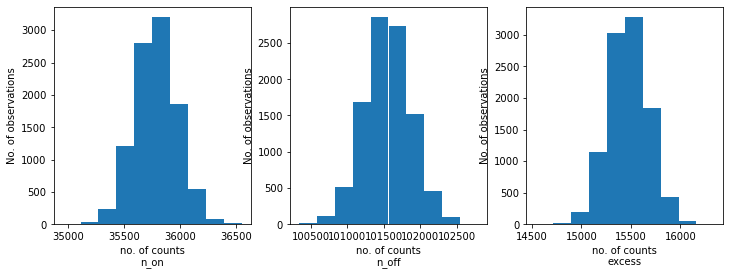

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 19min 9s, sys: 2.77 s, total: 19min 12s
Wall time: 19min 12s


In [15]:
results

[{'index': 2.2004131615267624,
  'amplitude': 1.3601486067384558e-12,
  'lambda_': 0.11118392218485627},
 {'index': 2.2186923632409274,
  'amplitude': 1.2740701906278792e-12,
  'lambda_': 0.10355633713292395},
 {'index': 2.2290865097653043,
  'amplitude': 1.2670462380582257e-12,
  'lambda_': 0.10267001537485579},
 {'index': 2.2298212935591573,
  'amplitude': 1.2642889222463049e-12,
  'lambda_': 0.09787260864958808},
 {'index': 2.241520319762935,
  'amplitude': 1.2651277900312725e-12,
  'lambda_': 0.09371184556562533},
 {'index': 2.2227177951774024,
  'amplitude': 1.2632522229738968e-12,
  'lambda_': 0.10172702474076745},
 {'index': 2.2390108273914753,
  'amplitude': 1.2625407510442764e-12,
  'lambda_': 0.0887897117289828},
 {'index': 2.2069527000591647,
  'amplitude': 1.313681166093688e-12,
  'lambda_': 0.11202134541516798},
 {'index': 2.2096971321107435,
  'amplitude': 1.3047687699340683e-12,
  'lambda_': 0.10273424521500699},
 {'index': 2.22604016793442,
  'amplitude': 1.262676439480

index: 2.219619624506185 += 0.012498174827646268


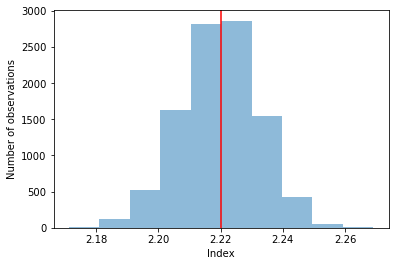

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.2903193221243198e-12 += 2.8351300983670992e-14


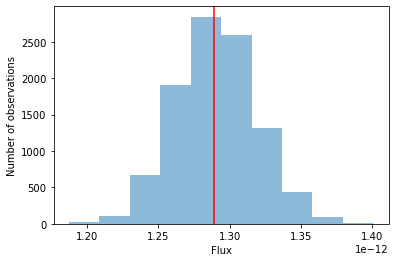

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 0.10046676114704442 += 0.008728200253698247


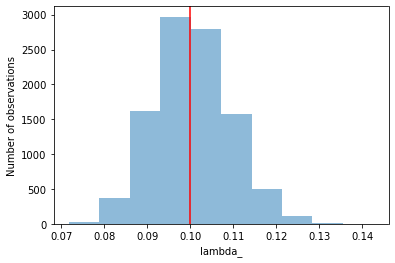

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")